# 2. Implementar y comparar diferentes transformaciones de intensidad a nivel de píxel. 
Con un teléfono celular tomen dos fotografías de la fachada (puede ser de la casa de algún integrante del equipo) a las 6 am y a las 7 pm. Las fotografías deben ser desde el mismo punto. Sobre las fotografías ilustren las siguientes operaciones (implementadas a mano):
- Ajuste de brillo
- Ajuste de contraste
- Corrección gama
- Sumen (A+B), resten(A-B), multipliquen (A*B) y dividan (A/B) ambas fotografías.


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

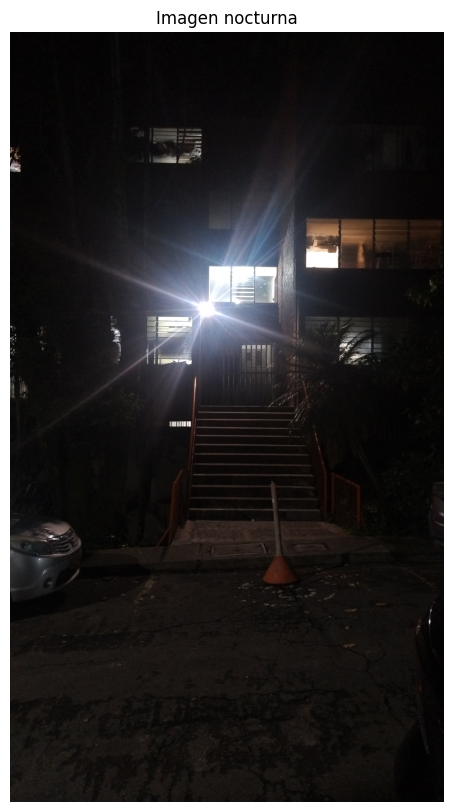

In [4]:
img_noche = cv2.imread("./Imagenes Fachada/Img5(SELECCIONADA).jpg")
img_noche_rgb = cv2.cvtColor(img_noche, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(6,10))
plt.imshow(img_noche_rgb)
plt.axis('off')
plt.title("Imagen nocturna")
plt.show()

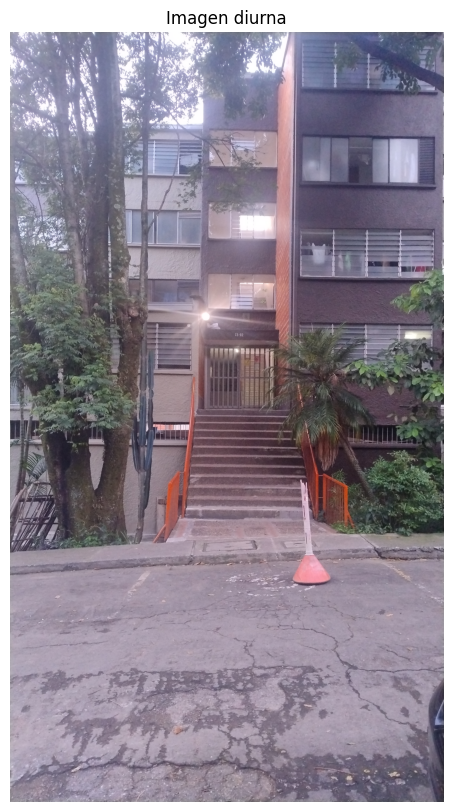

In [5]:
img_dia = cv2.imread("./Imagenes Fachada/Img3(SELECCIONADA).jpg")
img_dia_rgb = cv2.cvtColor(img_dia, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(6,10))
plt.imshow(img_dia_rgb)
plt.axis('off')
plt.title("Imagen diurna")
plt.show()

In [6]:
img_dia.shape, img_noche.shape

((4080, 2296, 3), (4080, 2296, 3))

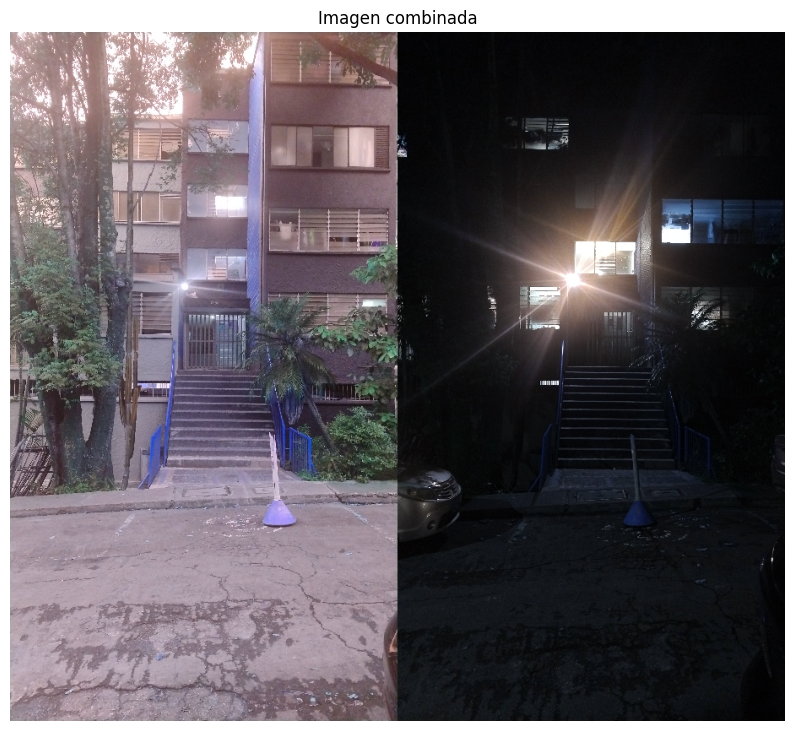

In [7]:
scale = 0.2
new_width = int(img_dia.shape[1] * scale)
new_height = int(img_dia.shape[0] * scale)
img_dia_resized = cv2.resize(img_dia, (new_width, new_height))
img_noche_resized = cv2.resize(img_noche, (new_width, new_height))
img_combined = np.hstack((img_dia_resized, img_noche_resized))

plt.figure(figsize=(10,10))
plt.imshow(img_combined)
plt.axis('off')
plt.title("Imagen combinada")
plt.show()

## 1. Ajuste de brillo

In [8]:
def ajustar_brillo(img, beta):
    img_float = img.astype(np.float32)
    img_bright = np.zeros_like(img_float)

    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            for k in range(img.shape[2]):
                nuevo_valor = img_float[i, j, k] + beta

                if nuevo_valor > 255:
                    nuevo_valor = 255
                elif nuevo_valor < 0:
                    nuevo_valor = 0

                img_bright[i, j, k] = nuevo_valor
    img_bright = img_bright.astype(np.uint8)

    return img_bright

In [9]:
img_b100 = ajustar_brillo(img_dia_resized, 100)
img_b50  = ajustar_brillo(img_dia_resized, 50)
img_b_50 = ajustar_brillo(img_dia_resized, -50)

img_b100 = cv2.cvtColor(img_b100, cv2.COLOR_BGR2RGB)
img_b50  = cv2.cvtColor(img_b50, cv2.COLOR_BGR2RGB)
img_b_50 = cv2.cvtColor(img_b_50, cv2.COLOR_BGR2RGB)

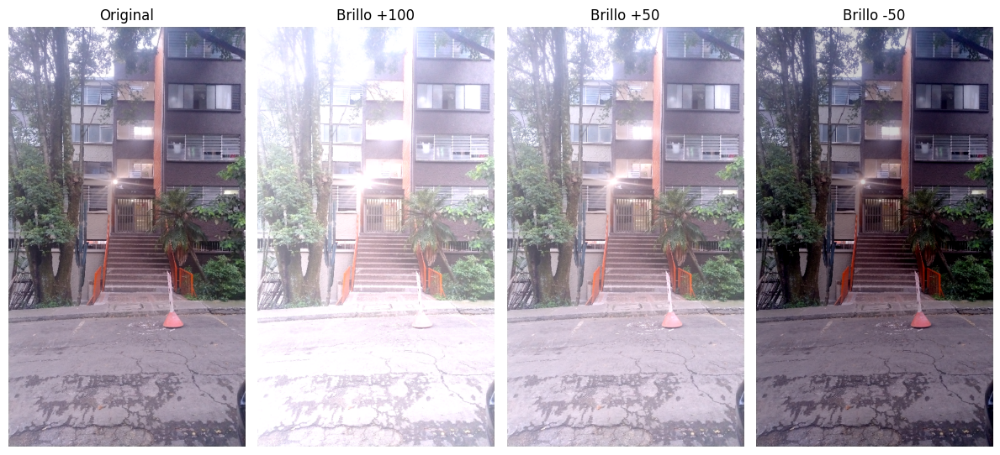

In [10]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 4, 1)
plt.imshow(cv2.cvtColor(img_dia_resized, cv2.COLOR_BGR2RGB))
plt.title("Original")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(img_b100)
plt.title("Brillo +100")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(img_b50)
plt.title("Brillo +50")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(img_b_50)
plt.title("Brillo -50")
plt.axis("off")

plt.tight_layout()
plt.show()

In [11]:
img_b100_n = ajustar_brillo(img_noche_resized, 100)
img_b50_n  = ajustar_brillo(img_noche_resized, 50)
img_b_50_n = ajustar_brillo(img_noche_resized, -50)

img_b100_n = cv2.cvtColor(img_b100_n, cv2.COLOR_BGR2RGB)
img_b50_n  = cv2.cvtColor(img_b50_n, cv2.COLOR_BGR2RGB)
img_b_50_n = cv2.cvtColor(img_b_50_n, cv2.COLOR_BGR2RGB)

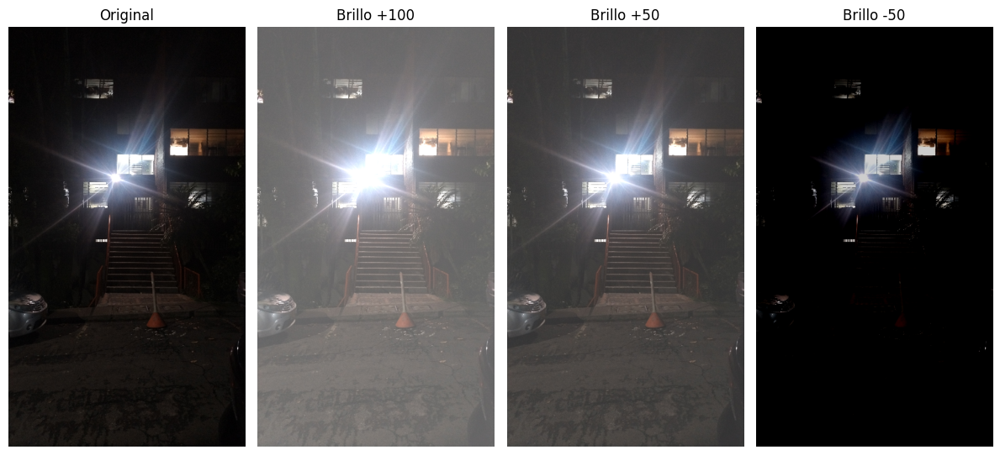

In [12]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 4, 1)
plt.imshow(cv2.cvtColor(img_noche_resized, cv2.COLOR_BGR2RGB))
plt.title("Original")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(img_b100_n)
plt.title("Brillo +100")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(img_b50_n)
plt.title("Brillo +50")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(img_b_50_n)
plt.title("Brillo -50")
plt.axis("off")

plt.tight_layout()
plt.show()

## 2. Ajuste de contraste

In [13]:
def ajustar_contraste(img, alpha):

    img_float = img.astype(np.float32)
    img_contrast = np.zeros_like(img_float)

    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            for k in range(img.shape[2]):
                nuevo_valor = alpha * (img_float[i, j, k] - 128) + 128

                # Limitar los valores al rango [0, 255]
                if nuevo_valor > 255:
                    nuevo_valor = 255
                elif nuevo_valor < 0:
                    nuevo_valor = 0

                img_contrast[i, j, k] = nuevo_valor

    img_contrast = img_contrast.astype(np.uint8)

    return img_contrast

In [14]:
img_contraste_bajo_d = ajustar_contraste(img_dia_resized, 0.5)
img_contraste_medio_d = ajustar_contraste(img_dia_resized, 1.5)
img_contraste_alto_d = ajustar_contraste(img_dia_resized, 2.0)

img_contraste_bajo_d = cv2.cvtColor(img_contraste_bajo_d, cv2.COLOR_BGR2RGB)
img_contraste_medio_d  = cv2.cvtColor(img_contraste_medio_d, cv2.COLOR_BGR2RGB)
img_contraste_alto_d = cv2.cvtColor(img_contraste_alto_d, cv2.COLOR_BGR2RGB)

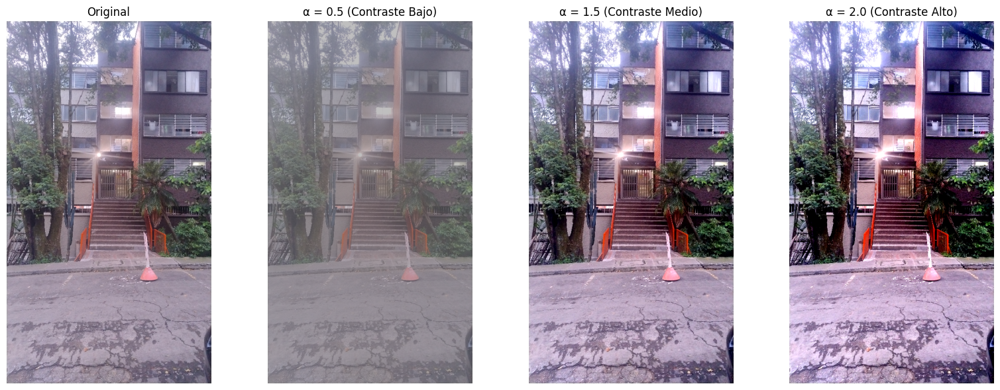

In [15]:
fig, axs = plt.subplots(1, 4, figsize=(16, 6))
axs[0].imshow(cv2.cvtColor(img_dia_resized, cv2.COLOR_BGR2RGB))
axs[0].set_title("Original")
axs[1].imshow(img_contraste_bajo_d)
axs[1].set_title("α = 0.5 (Contraste Bajo)")
axs[2].imshow(img_contraste_medio_d)
axs[2].set_title("α = 1.5 (Contraste Medio)")
axs[3].imshow(img_contraste_alto_d)
axs[3].set_title("α = 2.0 (Contraste Alto)")

for ax in axs:
    ax.axis("off")

plt.tight_layout()
plt.show()

In [16]:
img_contraste_bajo_n = ajustar_contraste(img_noche_resized, 0.5)
img_contraste_medio_n = ajustar_contraste(img_noche_resized, 1.5)
img_contraste_alto_n = ajustar_contraste(img_noche_resized, 2.0)

img_contraste_bajo_n = cv2.cvtColor(img_contraste_bajo_n, cv2.COLOR_BGR2RGB)
img_contraste_medio_n  = cv2.cvtColor(img_contraste_medio_n, cv2.COLOR_BGR2RGB)
img_contraste_alto_n = cv2.cvtColor(img_contraste_alto_n, cv2.COLOR_BGR2RGB)

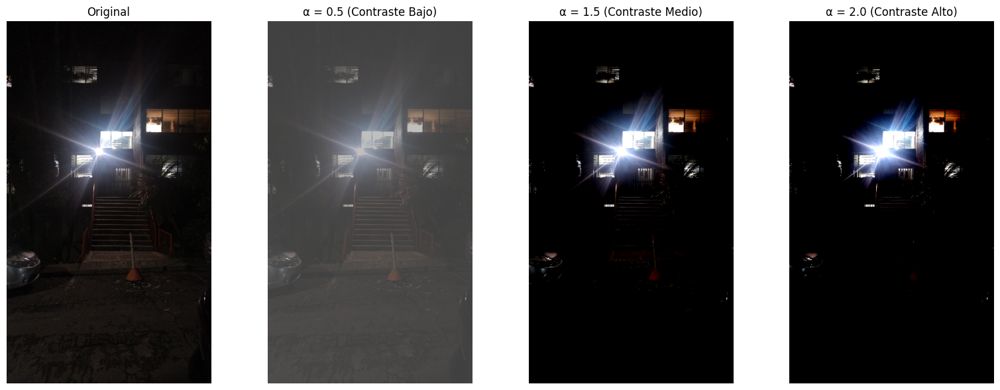

In [19]:
fig, axs = plt.subplots(1, 4, figsize=(16, 6))
axs[0].imshow(cv2.cvtColor(img_noche_resized, cv2.COLOR_BGR2RGB))
axs[0].set_title("Original")
axs[1].imshow(img_contraste_bajo_n)
axs[1].set_title("α = 0.5 (Contraste Bajo)")
axs[2].imshow(img_contraste_medio_n)
axs[2].set_title("α = 1.5 (Contraste Medio)")
axs[3].imshow(img_contraste_alto_n)
axs[3].set_title("α = 2.0 (Contraste Alto)")

for ax in axs:
    ax.axis("off")

plt.tight_layout()
plt.show()

## 3. Correción de gamma

In [20]:
def correccion_gamma(img, gamma):
    img_float = img.astype(np.float32) / 255.0  # Normalizamos a rango [0,1]
    img_gamma = np.zeros_like(img_float)

    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            for k in range(img.shape[2]):
                nuevo_valor = img_float[i, j, k] ** gamma
                img_gamma[i, j, k] = nuevo_valor

    img_gamma = np.clip(img_gamma * 255, 0, 255).astype(np.uint8)
    return img_gamma

In [21]:
img_gamma_05_d = correccion_gamma(img_dia_resized, 0.5)
img_gamma_15_d = correccion_gamma(img_dia_resized, 1.5)
img_gamma_22_d = correccion_gamma(img_dia_resized, 2.2)

img_gamma_05_d = cv2.cvtColor(img_gamma_05_d, cv2.COLOR_BGR2RGB)
img_gamma_15_d  = cv2.cvtColor(img_gamma_15_d, cv2.COLOR_BGR2RGB)
img_gamma_22_d = cv2.cvtColor(img_gamma_22_d, cv2.COLOR_BGR2RGB)

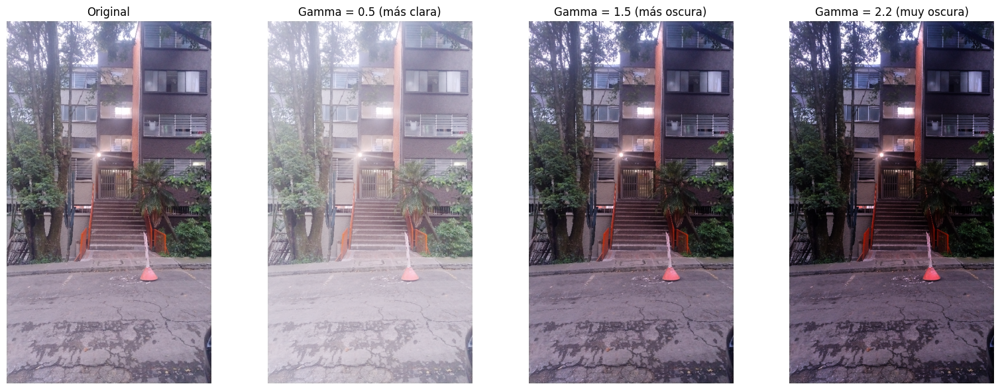

In [22]:
fig, axs = plt.subplots(1, 4, figsize=(16, 6))
axs[0].imshow(cv2.cvtColor(img_dia_resized, cv2.COLOR_BGR2RGB))
axs[0].set_title("Original")
axs[1].imshow(img_gamma_05_d)
axs[1].set_title("Gamma = 0.5 (más clara)")
axs[2].imshow(img_gamma_15_d )
axs[2].set_title("Gamma = 1.5 (más oscura)")
axs[3].imshow(img_gamma_22_d)
axs[3].set_title("Gamma = 2.2 (muy oscura)")

for ax in axs:
    ax.axis("off")

plt.tight_layout()
plt.show()

In [23]:
img_gamma_05_n = correccion_gamma(img_noche_resized, 0.5)
img_gamma_15_n = correccion_gamma(img_noche_resized, 1.5)
img_gamma_22_n = correccion_gamma(img_noche_resized, 2.2)

img_gamma_05_n = cv2.cvtColor(img_gamma_05_n, cv2.COLOR_BGR2RGB)
img_gamma_15_n  = cv2.cvtColor(img_gamma_15_n, cv2.COLOR_BGR2RGB)
img_gamma_22_n = cv2.cvtColor(img_gamma_22_n, cv2.COLOR_BGR2RGB)

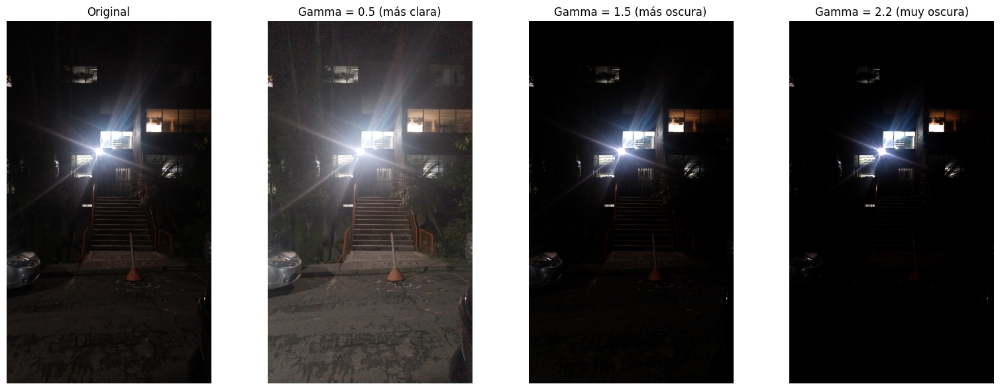

In [24]:
fig, axs = plt.subplots(1, 4, figsize=(16, 6))
axs[0].imshow(cv2.cvtColor(img_noche_resized, cv2.COLOR_BGR2RGB))
axs[0].set_title("Original")
axs[1].imshow(img_gamma_05_n)
axs[1].set_title("Gamma = 0.5 (más clara)")
axs[2].imshow(img_gamma_15_n )
axs[2].set_title("Gamma = 1.5 (más oscura)")
axs[3].imshow(img_gamma_22_n)
axs[3].set_title("Gamma = 2.2 (muy oscura)")

for ax in axs:
    ax.axis("off")

plt.tight_layout()
plt.show()

## 4. Operaciones Aritméticas (Suma, Resta, Multiplicación, División)

In [25]:
def operar_imagenes(operacion, fotoA, fotoB):
    A = fotoA.astype(np.float32)
    B = fotoB.astype(np.float32)

    if A.shape != B.shape:
        raise ValueError("Las imágenes deben tener las mismas dimensiones y canales.")

    if operacion == 'suma':
        resultado = A + B
    elif operacion == 'resta':
        resultado = A - B
    elif operacion == 'multiplicacion':
        resultado = A * B / 255.0
    elif operacion == 'division':
        B[B == 0] = 1
        resultado = A / B * 255.0
    else:
        raise ValueError("Operación no válida. Usa: 'suma', 'resta', 'multiplicacion' o 'division'.")

    resultado = np.clip(resultado, 0, 255).astype(np.uint8)
    return resultado

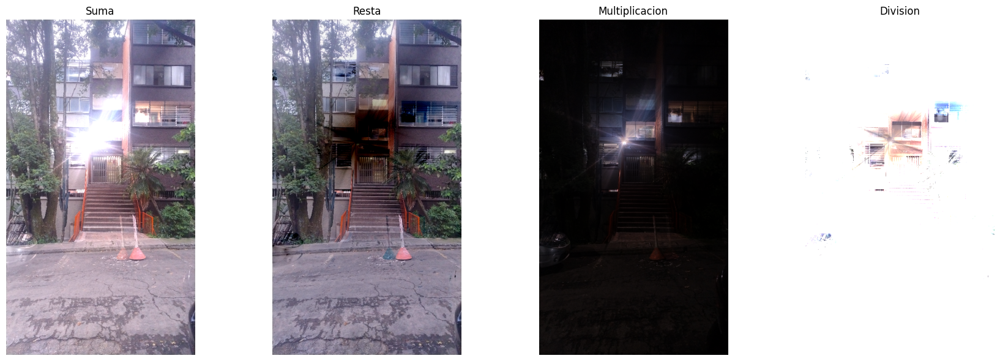

In [26]:
operaciones = ['suma', 'resta', 'multiplicacion', 'division']
resultados = [operar_imagenes(op, img_dia_resized, img_noche_resized) for op in operaciones]

fig, axs = plt.subplots(1, 4, figsize=(18, 6))
for i, op in enumerate(operaciones):
    axs[i].imshow((cv2.cvtColor(resultados[i], cv2.COLOR_BGR2RGB)))
    axs[i].set_title(op.capitalize())
    axs[i].axis('off')

plt.tight_layout()
plt.show()

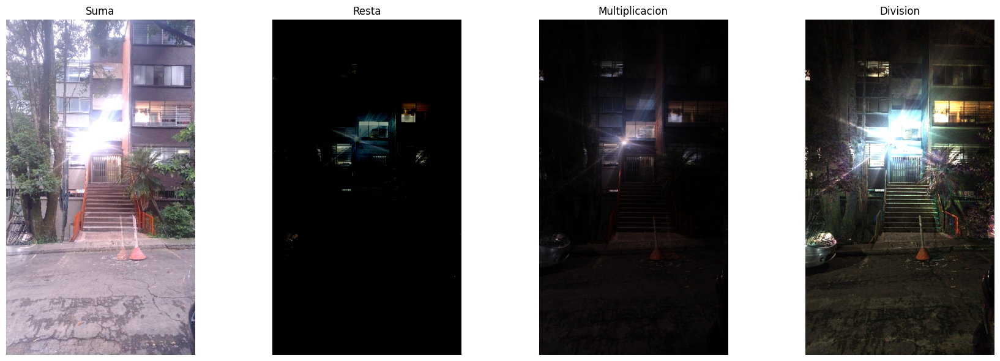

In [27]:
resultados_2 = [operar_imagenes(op,img_noche_resized, img_dia_resized ) for op in operaciones]

fig, axs = plt.subplots(1, 4, figsize=(18, 6))
for i, op in enumerate(operaciones):
    axs[i].imshow((cv2.cvtColor(resultados_2[i], cv2.COLOR_BGR2RGB)))
    axs[i].set_title(op.capitalize())
    axs[i].axis('off')

plt.tight_layout()
plt.show()